# Ensemble Learning

## Initial Imports

In [11]:
"""
Risk Classification
~~~~~~~~~~~~~~~~

This module provides classification for applied loans as Approved or deny due to credit risk.

This module accepts comma separated .csv file. 

It provides a data models to use for risk classification - 

- We will train and compare two different ensemble classifiers to predict loan risk and evaluate each model. 
  We will use the Balanced Random Forest Classifier and the Easy Ensemble Classifier. 

- Use different options and parameters to come up with balanced accuracy score.
- Visualize the random forest tree and provide feature list in descending order of importance.

- 

"""
import warnings
warnings.filterwarnings('ignore')

In [12]:
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter

In [36]:

import plotly.express as px
from pandas_profiling import ProfileReport
import hvplot.pandas
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from imblearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.svm import LinearSVC
from imblearn.metrics import make_index_balanced_accuracy
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, balanced_accuracy_score,recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import classification_report
from imblearn.metrics import classification_report_imbalanced, geometric_mean_score
from sklearn.utils import resample
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import ClusterCentroids
from imblearn.under_sampling import TomekLinks
from imblearn.combine import SMOTETomek
from sklearn.utils import compute_class_weight
import seaborn as sns

## Read the CSV and Perform Basic Data Cleaning

In [14]:
# Load the data
file_path = Path('./Data/LoanStats_2019Q1.csv')
LoanStats_df = pd.read_csv(file_path)

# Preview the data
LoanStats_df.head()

,loan_amnt,int_rate,installment,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,dti,...,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,hardship_flag,debt_settlement_flag
0,10500.0,0.1719,375.35,RENT,66000.0,Source Verified,Mar-2019,low_risk,n,27.24,...,85.7,100.0,0.0,0.0,65687.0,38199.0,2000.0,61987.0,N,N
1,25000.0,0.2000,929.09,MORTGAGE,105000.0,Verified,Mar-2019,low_risk,n,20.23,...,91.2,50.0,1.0,0.0,271427.0,60641.0,41200.0,49197.0,N,N
2,20000.0,0.2000,529.88,MORTGAGE,56000.0,Verified,Mar-2019,low_risk,n,24.26,...,66.7,50.0,0.0,0.0,60644.0,45684.0,7500.0,43144.0,N,N
3,10000.0,0.1640,353.55,RENT,92000.0,Verified,Mar-2019,low_risk,n,31.44,...,100.0,50.0,1.0,0.0,99506.0,68784.0,19700.0,76506.0,N,N
4,22000.0,0.1474,520.39,MORTGAGE,52000.0,Not Verified,Mar-2019,low_risk,n,18.76,...,100.0,0.0,0.0,0.0,219750.0,25919.0,27600.0,20000.0,N,N


Data Profiling

In [16]:
import sweetviz as sweetviz
report = sweetviz.analyze([LoanStats_df, "Loan Stats Dataset"])


                                             |                                             | [  0%]   00:00 ->…

NameError: name 'report_comp' is not defined


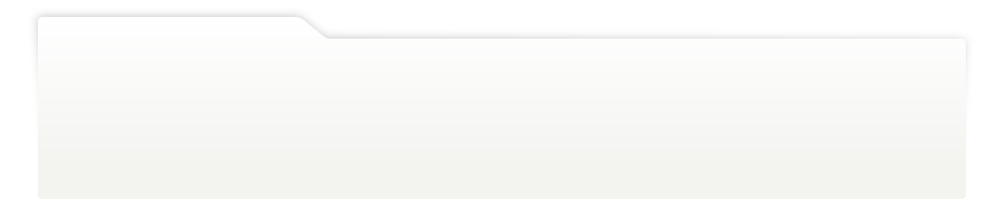
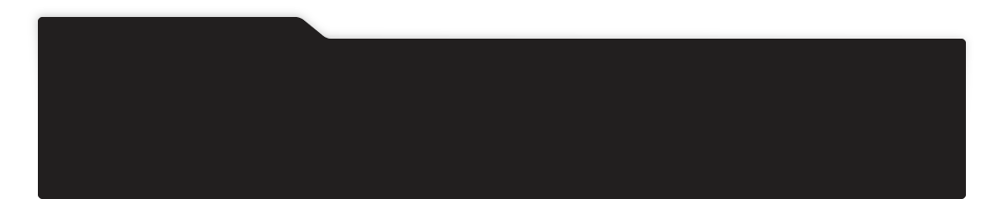
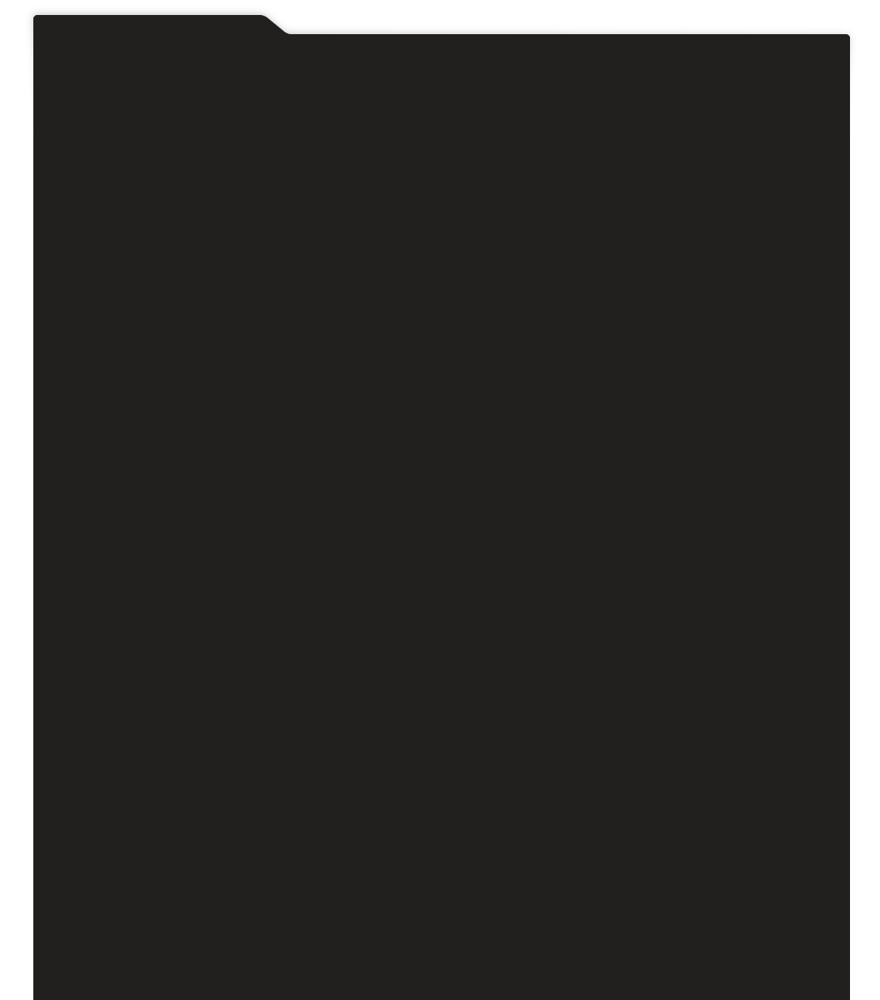
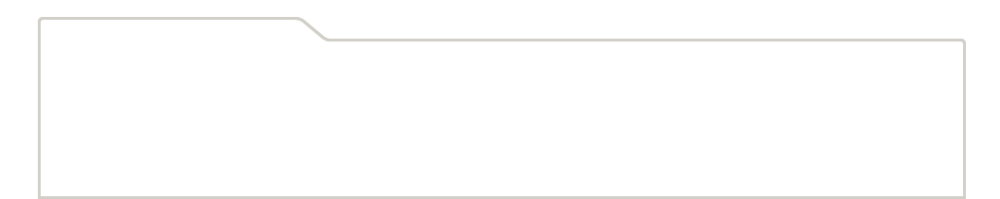
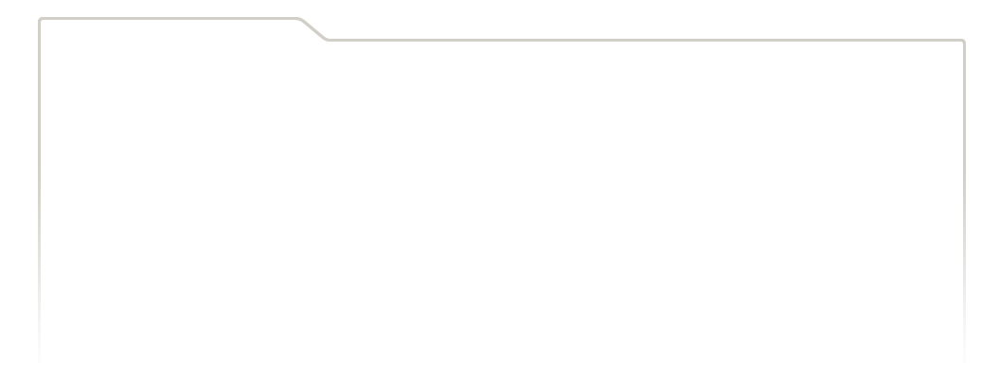
...
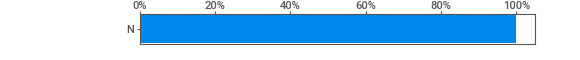
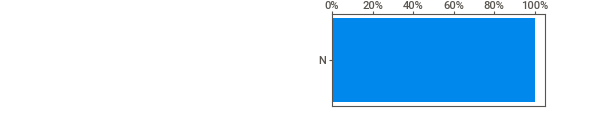
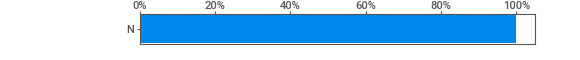
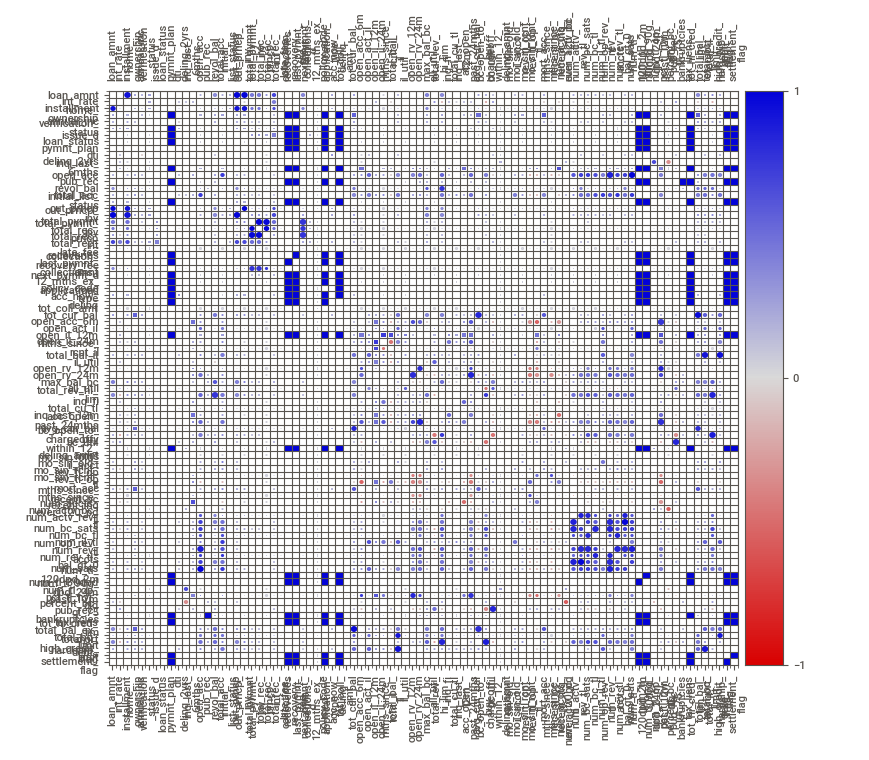
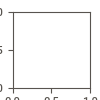

In [17]:
report.show_notebook(w=None, h=None,
scale=None,
layout='vertical')

Above summary shows there are no rows/data with missing or duplicate values.
There are 23 categorical variables. We may need to convert them using one hot-encoding.
We have some columns with only one distinct values which will not help us in prediction and we will remove those.
pymnt_plan
recoveries
collection_recovery_fee
policy_code
acc_now_delinq
num_tl_120dpd_2m
num_tl_30dpd
tax_liens
hardship_flag
debt_settlement_flag


In [ ]:
#Image("./IMG/sweetviz.JPG")

Data Preparation and Analysis

In [18]:
#Drop columns with only one distinct value
LoanStats_df.drop(['pymnt_plan', 'recoveries','collection_recovery_fee','policy_code','acc_now_delinq','num_tl_120dpd_2m','num_tl_30dpd','tax_liens','hardship_flag','debt_settlement_flag'],inplace=True,axis=1)


loan_amnt                     0.0
int_rate                      0.0
installment                   0.0
home_ownership                0.0
annual_inc                    0.0
                             ... 
pub_rec_bankruptcies          0.0
tot_hi_cred_lim               0.0
total_bal_ex_mort             0.0
total_bc_limit                0.0
total_il_high_credit_limit    0.0
Length: 76, dtype: float64

In [20]:
#List of categorical columns
LoanStats_df.select_dtypes(include=['object']).columns.tolist()

['home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'initial_list_status',
 'next_pymnt_d',
 'application_type']

In [26]:
#Check distinct counts for above features
LoanStats_df.select_dtypes(include=['object']).describe(include='all').loc['unique', :]

home_ownership         4
verification_status    3
issue_d                3
loan_status            2
initial_list_status    2
next_pymnt_d           2
application_type       2
Name: unique, dtype: object

In [27]:
#Implement One hot encoding. We will do it for all except loan_status. 
#loan_status we will use following
# 1 = low_risk and 0 = high_risk
LoanStats_df["loan_status"]=LoanStats_df["loan_status"].apply(lambda x: 1 if x=="low_risk" else 0)

categorical_columns = LoanStats_df.select_dtypes(["object"]).columns
#Create dummy variables
#tempdf=pd.get_dummies(lending_data_df[cols],drop_first=True)

for column in categorical_columns:
    tempdf = pd.get_dummies(LoanStats_df[column], prefix=column)
    LoanStats_df = pd.merge(
        left=LoanStats_df,
        right=tempdf,
        left_index=True,
        right_index=True,
    )
    LoanStats_df = LoanStats_df.drop(columns=column)
print(LoanStats_df)

       loan_amnt  int_rate  installment  annual_inc  loan_status    dti  \
0        10500.0    0.1719       375.35     66000.0            1  27.24   
1        25000.0    0.2000       929.09    105000.0            1  20.23   
2        20000.0    0.2000       529.88     56000.0            1  24.26   
3        10000.0    0.1640       353.55     92000.0            1  31.44   
4        22000.0    0.1474       520.39     52000.0            1  18.76   
...          ...       ...          ...         ...          ...    ...   
68812    10000.0    0.1502       346.76     26000.0            1   9.60   
68813    12000.0    0.2727       368.37     63000.0            1  29.07   
68814     5000.0    0.1992       185.62     52000.0            1  14.86   
68815    40000.0    0.0646      1225.24    520000.0            1   9.96   
68816    16000.0    0.1131       350.36     72000.0            1   7.02   

       delinq_2yrs  inq_last_6mths  open_acc  pub_rec  ...  \
0              0.0             0.0   

In [28]:
LoanStats_df.columns

Index(['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'loan_status',
       'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'last_pymnt_amnt', 'collections_12_mths_ex_med',
       'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_act_il',
       'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il',
       'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util',
       'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m',
       'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util',
       'chargeoff_within_12_mths', 'delinq_amnt', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_inq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_re

                                             |                                             | [  0%]   00:00 ->…


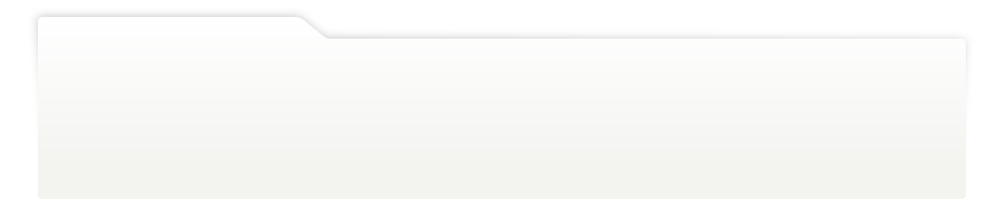
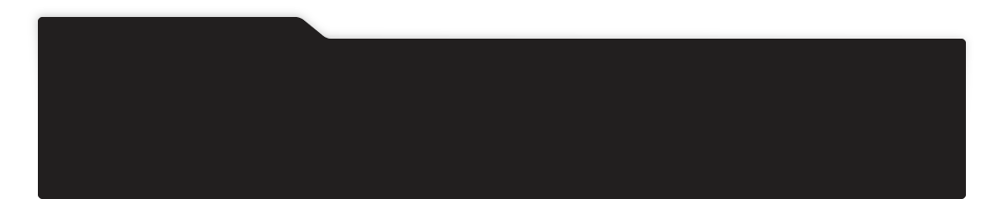
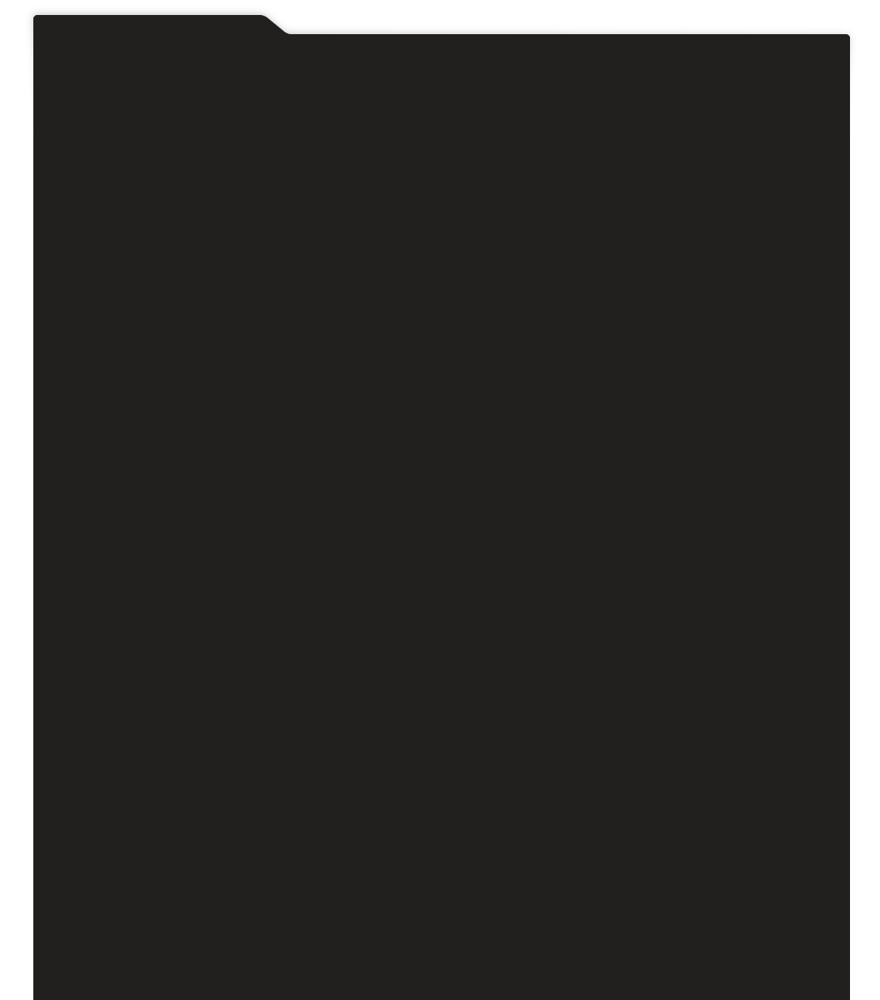
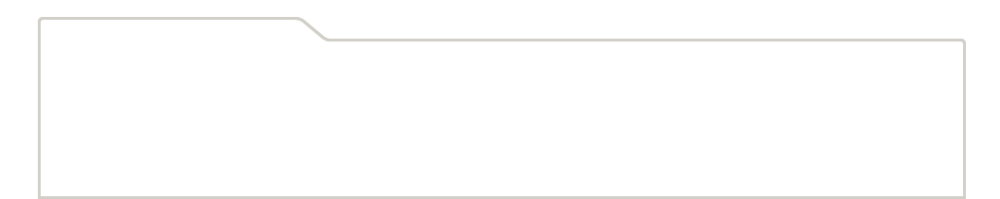
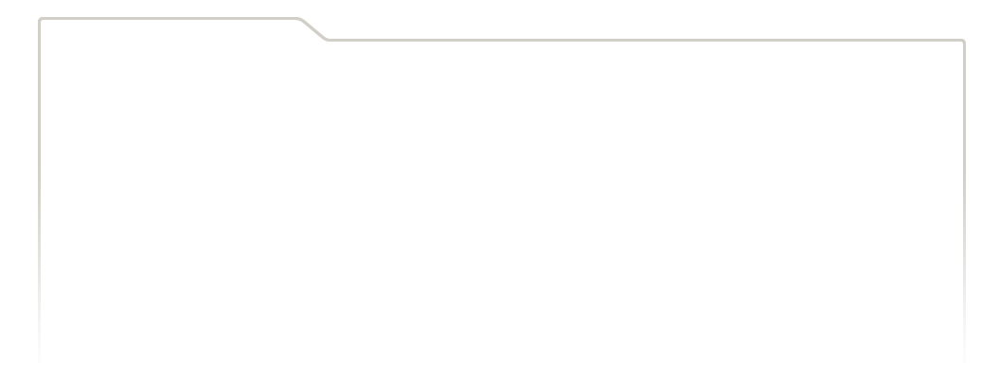
...
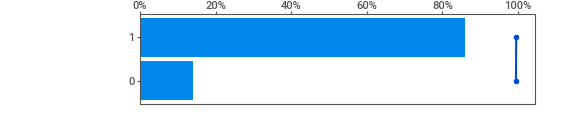
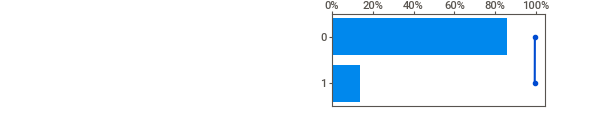
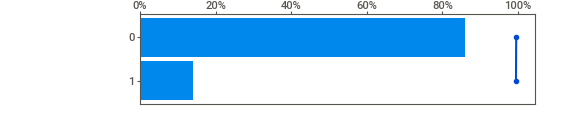
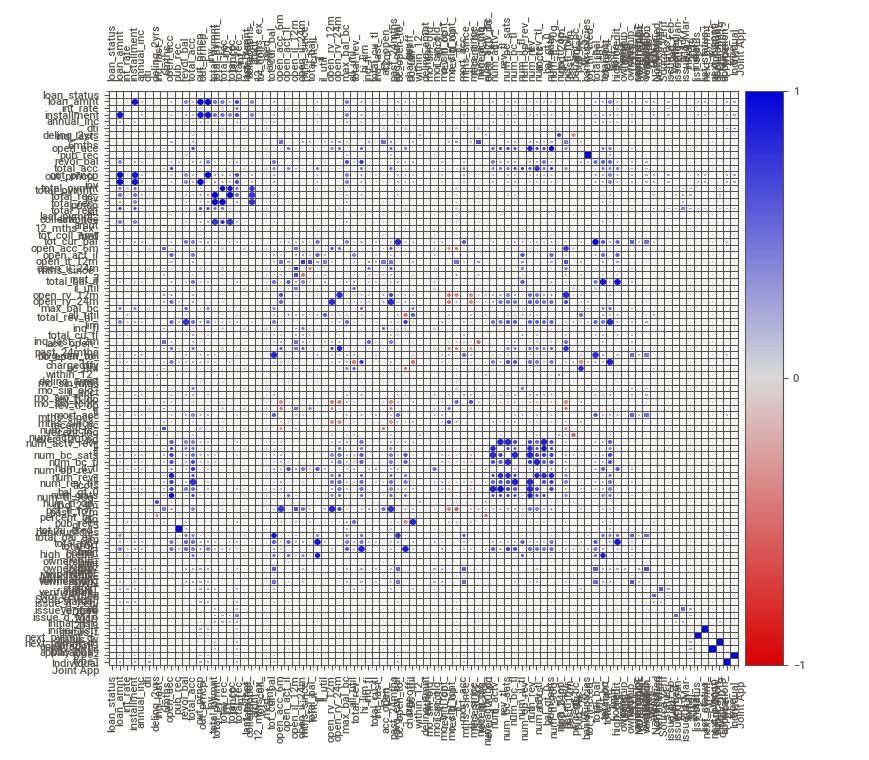
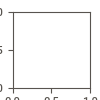

In [29]:
#Data Profiling again
report = sweetviz.analyze([LoanStats_df, "Loan Stats Dataset"],target_feat='loan_status')
report.show_notebook(w=None, h=None,
scale=None,
layout='vertical')

## Split the Data into Training and Testing

In [30]:
# Create our features
X = LoanStats_df.drop(columns="loan_status")


# Create our target
y = LoanStats_df["loan_status"].copy()

In [31]:
X.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,...,verification_status_Verified,issue_d_Feb-2019,issue_d_Jan-2019,issue_d_Mar-2019,initial_list_status_f,initial_list_status_w,next_pymnt_d_Apr-2019,next_pymnt_d_May-2019,application_type_Individual,application_type_Joint App
count,68817.000000,68817.000000,68817.000000,6.881700e+04,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,...,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000,68817.000000
mean,16677.594562,0.127718,480.652863,8.821371e+04,21.778153,0.217766,0.497697,12.587340,0.126030,17604.142828,...,0.148001,0.371696,0.451066,0.177238,0.123879,0.876121,0.383161,0.616839,0.860340,0.139660
std,10277.348590,0.048130,288.062432,1.155800e+05,20.199244,0.718367,0.758122,6.022869,0.336797,21835.880400,...,0.355104,0.483261,0.497603,0.381873,0.329446,0.329446,0.486161,0.486161,0.346637,0.346637
min,1000.000000,0.060000,30.890000,4.000000e+01,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9000.000000,0.088100,265.730000,5.000000e+04,13.890000,0.000000,0.000000,8.000000,0.000000,6293.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,15000.000000,0.118000,404.560000,7.300000e+04,19.760000,0.000000,0.000000,11.000000,0.000000,12068.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,24000.000000,0.155700,648.100000,1.040000e+05,26.660000,0.000000,1.000000,16.000000,0.000000,21735.000000,...,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000
max,40000.000000,0.308400,1676.230000,8.797500e+06,999.000000,18.000000,5.000000,72.000000,4.000000,587191.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [32]:
# 1 = low_risk and 0 = high_risk
y.value_counts()

1    68470
0      347
Name: loan_status, dtype: int64

In [33]:
# Split the X and y into X_train, X_test, y_train, y_test
X_train, X_test, y_train, y_test= train_test_split(X, 
                                                   y, 
                                                   random_state=1, 
                                                   stratify=y,test_size=0.2)
X_train.shape

(55053, 85)

In [34]:
#check the Target balance in training and test splits
# 1 = low_risk and 0 = high_risk
display(y_train.value_counts())

display(y_test.value_counts())

1    54775
0      278
Name: loan_status, dtype: int64

1    13695
0       69
Name: loan_status, dtype: int64

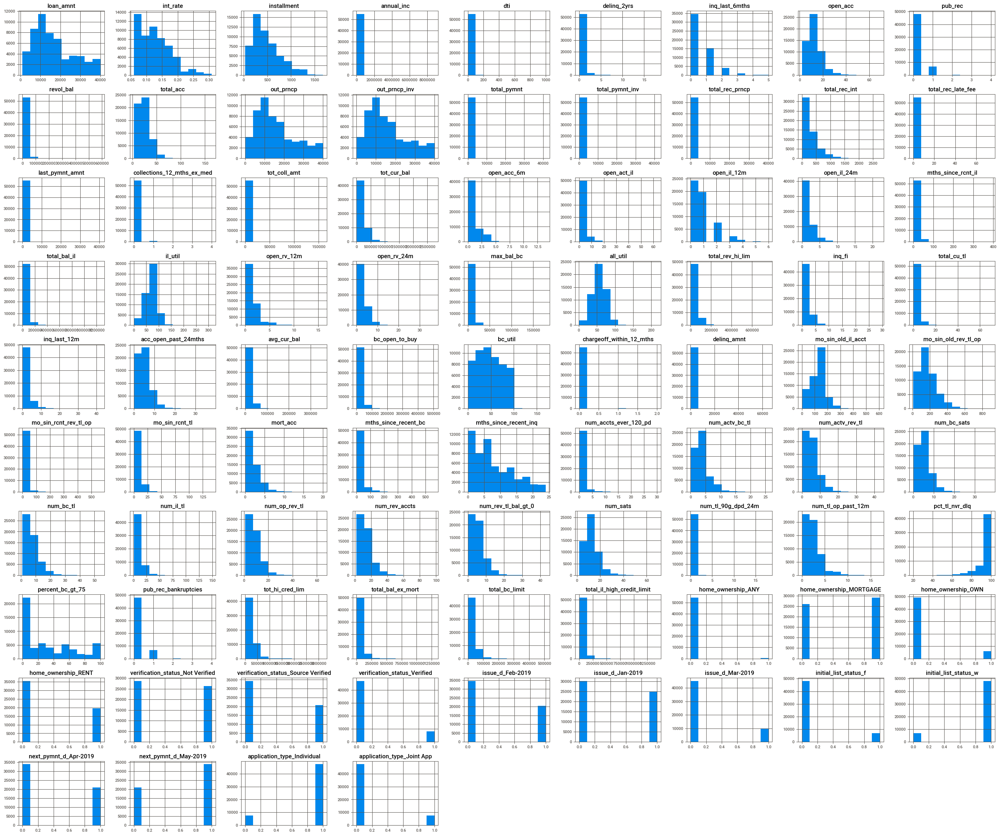

In [42]:
# check distribution of each of the features
dataset = pd.DataFrame(X_train)
dataset.columns=X_train.columns
# histograms of the variables
dataset.hist(figsize=(35, 30))
plt.show()

## Data Pre-Processing

Scale the training and testing data using the `StandardScaler` from `sklearn`. Remember that when scaling the data, you only scale the features data (`X_train` and `X_testing`).

In [43]:
#If you observe the above plots, you will see we have some features of higher magnitude(x-axis) then others.
# We will need to use standardization.

#We also observe some of the features have similar distribution and might have very high correlation. We will see later
#if we should remove some of these features.
# Create the StandardScaler instance
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()

In [44]:
# Fit the Standard Scaler with the training data
# Scale the training and testing data
X_train_s = scale.fit_transform(X_train)
X_test_s = scale.transform(X_test)
X_train_s = scale.transform(X_train)

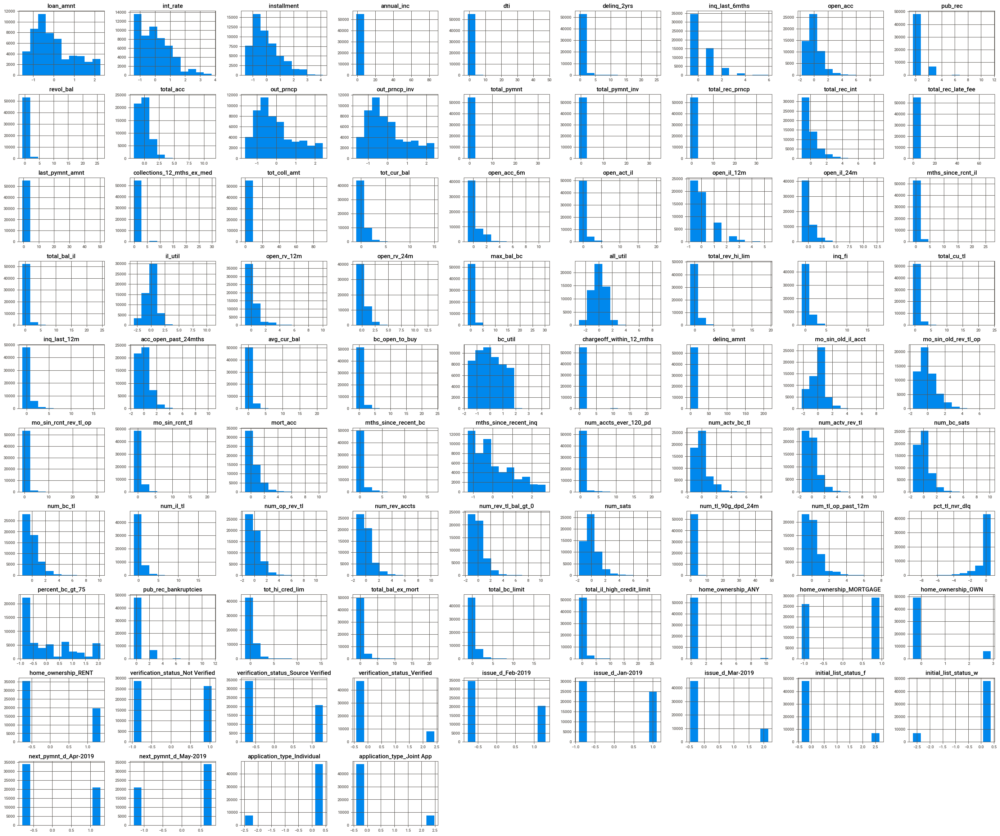

In [46]:
#Check distribution after scaling
# convert the array back to a dataframe
dataset = pd.DataFrame(X_train_s)
dataset.columns=X_train.columns
dataset.hist(figsize=(35, 30))
plt.show()

## Ensemble Learners

In this section, you will compare two ensemble algorithms to determine which algorithm results in the best performance. You will train a Balanced Random Forest Classifier and an Easy Ensemble classifier . For each algorithm, be sure to complete the folliowing steps:

1. Train the model using the training data. 
2. Calculate the balanced accuracy score from sklearn.metrics.
3. Display the confusion matrix from sklearn.metrics.
4. Generate a classication report using the `imbalanced_classification_report` from imbalanced-learn.
5. For the Balanced Random Forest Classifier only, print the feature importance sorted in descending order (most important feature to least important) along with the feature score

Note: Use a random state of 1 for each algorithm to ensure consistency between tests

### Balanced Random Forest Classifier

Random forest is an extension of bagging that also randomly selects subsets of features used in each data sample

In [ ]:
# Resample the training data with the BalancedRandomForestClassifier
# YOUR CODE HERE

In [ ]:
# Calculated the balanced accuracy score
# YOUR CODE HERE

In [ ]:
# Display the confusion matrix
# YOUR CODE HERE

In [ ]:
# Print the imbalanced classification report
# YOUR CODE HERE

In [ ]:
# List the features sorted in descending order by feature importance
# YOUR CODE HERE

### Easy Ensemble Classifier

In [ ]:
# Train the Classifier
# YOUR CODE HERE

In [ ]:
# Calculated the balanced accuracy score
# YOUR CODE HERE

In [ ]:
# Display the confusion matrix
# YOUR CODE HERE

In [ ]:
# Print the imbalanced classification report
# YOUR CODE HERE

### Final Questions

1. Which model had the best balanced accuracy score?

    YOUR ANSWER HERE.

2. Which model had the best recall score?

    YOUR ANSWER HERE.

3. Which model had the best geometric mean score?

    YOUR ANSWER HERE.

4. What are the top three features?

    YOUR ANSWER HERE.